In [1]:
import gc
import os
import cv2 # pip install opencv-python
import math
import base64
import random
import numpy as np
from PIL import Image
from tqdm import tqdm
from datetime import datetime
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
from torch.cuda import amp
import torch.nn.functional as F
from torch.optim import Adam, AdamW
from torch.utils.data import Dataset, DataLoader

import torchvision
import torchvision.transforms as TF
import torchvision.datasets as datasets
from torchvision.utils import make_grid

#from torchmetrics import MeanMetric # pip install torchmetrics

from IPython.display import display, HTML, clear_output

d:\Development\anaconda3\envs\d2l\lib\site-packages\numpy\_distributor_init.py:30: UserWarning: loaded more than 1 DLL from .libs:
d:\Development\anaconda3\envs\d2l\lib\site-packages\numpy\.libs\libopenblas.FB5AE2TYXYH2IJRDKGDGQ3XBKLKTF43H.gfortran-win_amd64.dll
d:\Development\anaconda3\envs\d2l\lib\site-packages\numpy\.libs\libopenblas64__v0.3.21-gcc_10_3_0.dll
  warnings.warn("loaded more than 1 DLL from .libs:"


**本模型使用的是花朵数据集进行的训练，模型接收随机噪音图像，输出花的图像**

# UNet Model

In [104]:
class SinusoidalPositionEmbeddings(nn.Module):
    def __init__(self, total_time_steps=1000, time_emb_dims=128, time_emb_dims_exp=512):
        super().__init__()

        half_dim = time_emb_dims // 2

        emb = math.log(10000) / (half_dim - 1)
        emb = torch.exp(torch.arange(half_dim, dtype=torch.float32) * -emb)

        ts = torch.arange(total_time_steps, dtype=torch.float32)

        emb = torch.unsqueeze(ts, dim=-1) * torch.unsqueeze(emb, dim=0)
        emb = torch.cat((emb.sin(), emb.cos()), dim=-1)

        self.time_blocks = nn.Sequential(
            nn.Embedding.from_pretrained(emb),
            nn.Linear(in_features=time_emb_dims, out_features=time_emb_dims_exp),
            nn.SiLU(),
            nn.Linear(in_features=time_emb_dims_exp, out_features=time_emb_dims_exp),
        )

    def forward(self, time):
        return self.time_blocks(time)


class AttentionBlock(nn.Module):
    def __init__(self, channels=64):
        super().__init__()
        self.channels = channels

        self.group_norm = nn.GroupNorm(num_groups=8, num_channels=channels)
        self.mhsa = nn.MultiheadAttention(embed_dim=self.channels, num_heads=4, batch_first=True)

    def forward(self, x):
        B, _, H, W = x.shape
        h = self.group_norm(x)
        h = h.reshape(B, self.channels, H * W).swapaxes(1, 2)  # [B, C, H, W] --> [B, C, H * W] --> [B, H*W, C]
        h, _ = self.mhsa(h, h, h)  # [B, H*W, C]
        h = h.swapaxes(2, 1).view(B, self.channels, H, W)  # [B, C, H*W] --> [B, C, H, W]
        return x + h


class ResnetBlock(nn.Module):
    def __init__(self, *, in_channels, out_channels, dropout_rate=0.1, time_emb_dims=512, apply_attention=False):
        super().__init__()
        self.in_channels = in_channels
        self.out_channels = out_channels

        self.act_fn = nn.SiLU()
        # Group 1
        self.normlize_1 = nn.GroupNorm(num_groups=8, num_channels=self.in_channels)
        self.conv_1 = nn.Conv2d(in_channels=self.in_channels, out_channels=self.out_channels, kernel_size=3, stride=1, padding="same")

        # Group 2 time embedding
        self.dense_1 = nn.Linear(in_features=time_emb_dims, out_features=self.out_channels)

        # Group 3
        self.normlize_2 = nn.GroupNorm(num_groups=8, num_channels=self.out_channels)
        self.dropout = nn.Dropout2d(p=dropout_rate)
        self.conv_2 = nn.Conv2d(in_channels=self.out_channels, out_channels=self.out_channels, kernel_size=3, stride=1, padding="same")

        if self.in_channels != self.out_channels:
            self.match_input = nn.Conv2d(in_channels=self.in_channels, out_channels=self.out_channels, kernel_size=1, stride=1)
        else:
            self.match_input = nn.Identity()

        if apply_attention:
            self.attention = AttentionBlock(channels=self.out_channels)
        else:
            self.attention = nn.Identity()

    def forward(self, x, t):
        # group 1
        h = self.act_fn(self.normlize_1(x))
        h = self.conv_1(h)

        # group 2
        # add in timestep embedding
        h += self.dense_1(self.act_fn(t))[:, :, None, None]

        # group 3
        h = self.act_fn(self.normlize_2(h))
        h = self.dropout(h)
        h = self.conv_2(h)

        # Residual and attention
        h = h + self.match_input(x)
        h = self.attention(h)

        return h


class DownSample(nn.Module):
    def __init__(self, channels):
        super().__init__()
        self.downsample = nn.Conv2d(in_channels=channels, out_channels=channels, kernel_size=3, stride=2, padding=1)

    def forward(self, x, *args):
        return self.downsample(x)


class UpSample(nn.Module):
    def __init__(self, in_channels):
        super().__init__()

        self.upsample = nn.Sequential(
            nn.Upsample(scale_factor=2, mode="nearest"),
            nn.Conv2d(in_channels=in_channels, out_channels=in_channels, kernel_size=3, stride=1, padding=1),
        )

    def forward(self, x, *args):
        return self.upsample(x)


class UNet(nn.Module):
    def __init__(
        self,
        input_channels=3,
        output_channels=3,
        num_res_blocks=2,
        base_channels=128,
        base_channels_multiples=(1, 2, 4, 8),
        apply_attention=(False, False, True, False),
        dropout_rate=0.1,
        time_multiple=4,
    ):
        super().__init__()

        time_emb_dims_exp = base_channels * time_multiple
        self.time_embeddings = SinusoidalPositionEmbeddings(time_emb_dims=base_channels, time_emb_dims_exp=time_emb_dims_exp)

        self.first = nn.Conv2d(in_channels=input_channels, out_channels=base_channels, kernel_size=3, stride=1, padding="same")

        num_resolutions = len(base_channels_multiples)

        # Encoder part of the UNet. Dimension reduction.
        self.encoder_blocks = nn.ModuleList()
        curr_channels = [base_channels]
        in_channels = base_channels

        for level in range(num_resolutions):
            out_channels = base_channels * base_channels_multiples[level]

            for _ in range(num_res_blocks):

                block = ResnetBlock(
                    in_channels=in_channels,
                    out_channels=out_channels,
                    dropout_rate=dropout_rate,
                    time_emb_dims=time_emb_dims_exp,
                    apply_attention=apply_attention[level],
                )
                self.encoder_blocks.append(block)

                in_channels = out_channels
                curr_channels.append(in_channels)

            if level != (num_resolutions - 1):
                self.encoder_blocks.append(DownSample(channels=in_channels))
                curr_channels.append(in_channels)

        # Bottleneck in between
        self.bottleneck_blocks = nn.ModuleList(
            (
                ResnetBlock(
                    in_channels=in_channels,
                    out_channels=in_channels,
                    dropout_rate=dropout_rate,
                    time_emb_dims=time_emb_dims_exp,
                    apply_attention=True,
                ),
                ResnetBlock(
                    in_channels=in_channels,
                    out_channels=in_channels,
                    dropout_rate=dropout_rate,
                    time_emb_dims=time_emb_dims_exp,
                    apply_attention=False,
                ),
            )
        )

        # Decoder part of the UNet. Dimension restoration with skip-connections.
        self.decoder_blocks = nn.ModuleList()

        for level in reversed(range(num_resolutions)):
            out_channels = base_channels * base_channels_multiples[level]

            for _ in range(num_res_blocks + 1):
                encoder_in_channels = curr_channels.pop()
                block = ResnetBlock(
                    in_channels=encoder_in_channels + in_channels,
                    out_channels=out_channels,
                    dropout_rate=dropout_rate,
                    time_emb_dims=time_emb_dims_exp,
                    apply_attention=apply_attention[level],
                )

                in_channels = out_channels
                self.decoder_blocks.append(block)

            if level != 0:
                self.decoder_blocks.append(UpSample(in_channels))

        self.final = nn.Sequential(
            nn.GroupNorm(num_groups=8, num_channels=in_channels),
            nn.SiLU(),
            nn.Conv2d(in_channels=in_channels, out_channels=output_channels, kernel_size=3, stride=1, padding="same"),
        )

    def forward(self, x, t):

        time_emb = self.time_embeddings(t)

        h = self.first(x)
        outs = [h]

        for layer in self.encoder_blocks:
            h = layer(h, time_emb)
            outs.append(h)

        for layer in self.bottleneck_blocks:
            h = layer(h, time_emb)

        for layer in self.decoder_blocks:
            if isinstance(layer, ResnetBlock):
                out = outs.pop()
                h = torch.cat([h, out], dim=1)
            h = layer(h, time_emb)

        h = self.final(h)

        return h

# Helper Functions

In [105]:
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list, tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader:
    """Wrap a dataloader to move data to a device"""

    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl:
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

def get_default_device():
    return torch.device("cuda" if torch.cuda.is_available() else "cpu")

def save_images(images, path, **kwargs):
    grid = make_grid(images, **kwargs)
    ndarr = grid.permute(1, 2, 0).to("cpu").numpy()
    im = Image.fromarray(ndarr)
    im.save(path)
    
def get(element: torch.Tensor, t: torch.Tensor):
    """
    Get value at index position "t" in "element" and
        reshape it to have the same dimension as a batch of images.
    """
    ele = element.gather(-1, t)
    return ele.reshape(-1, 1, 1, 1)

def setup_log_directory(config):
    '''Log and Model checkpoint directory Setup'''
    
    if os.path.isdir(config.root_log_dir):
        # Get all folders numbers in the root_log_dir
        folder_numbers = [int(folder.replace("version_", "")) for folder in os.listdir(config.root_log_dir)]
        
        # Find the latest version number present in the log_dir
        last_version_number = max(folder_numbers)

        # New version name
        version_name = f"version_{last_version_number + 1}"

    else:
        version_name = config.log_dir

    # Update the training config default directory 
    log_dir        = os.path.join(config.root_log_dir,        version_name)
    checkpoint_dir = os.path.join(config.root_checkpoint_dir, version_name)

    # Create new directory for saving new experiment version
    os.makedirs(log_dir,        exist_ok=True)
    os.makedirs(checkpoint_dir, exist_ok=True)

    print(f"Logging at: {log_dir}")
    print(f"Model Checkpoint at: {checkpoint_dir}")
    
    return log_dir, checkpoint_dir

def frames2vid(images, save_path):

    WIDTH = images[0].shape[1]
    HEIGHT = images[0].shape[0]

#     fourcc = cv2.VideoWriter_fourcc(*'XVID')
#     fourcc = 0
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    video = cv2.VideoWriter(save_path, fourcc, 25, (WIDTH, HEIGHT))

    # Appending the images to the video one by one
    for image in images:
        video.write(image)

    # Deallocating memories taken for window creation
    # cv2.destroyAllWindows()
    video.release()
    return 

def display_gif(gif_path):
    b64 = base64.b64encode(open(gif_path,'rb').read()).decode('ascii')
    display(HTML(f'<img src="data:image/gif;base64,{b64}" />'))

# Configurations

In [2]:
# 查看gpu配置
print(torch.cuda.is_available()) #cuda是否可用
print(torch.cuda.device_count())#GPU 的数量
print(torch.cuda.current_device()) #当前设备的索引，从0开始
print(torch.cuda.get_device_name(0))#返回GPU名字

False
0


AssertionError: Torch not compiled with CUDA enabled

In [152]:
from dataclasses import dataclass

@dataclass
class BaseConfig:
    DEVICE = get_default_device()
    #DEVICE = torch.device("cuda:0")  # 指定gpu0 3090训练
    DATASET = "Flowers" #  "MNIST", "Cifar-10", "Cifar-100", "Flowers"
    
    # For logging inferece images and saving checkpoints.
    root_log_dir = os.path.join("Logs_Checkpoints", "Inference")
    root_checkpoint_dir = os.path.join("Logs_Checkpoints", "checkpoints")

    # Current log and checkpoint directory.
    log_dir = "version_0"
    checkpoint_dir = "version_0"

@dataclass
class TrainingConfig:
    TIMESTEPS = 1000 # Define number of diffusion timesteps
    IMG_SHAPE = (1, 32, 32) if BaseConfig.DATASET == "MNIST" else (3, 32, 32) 
    NUM_EPOCHS = 800
    BATCH_SIZE = 512 # GPU对2的幂次的batch可以发挥更佳的性能 16、32、64、128、 256、512…
    LR = 2e-4
    NUM_WORKERS = 0 # 默认未2，win环境下需要成0

# Load Dataset & Build Dataloader

In [153]:
def get_dataset(dataset_name='MNIST'):
    transforms = TF.Compose(
        [
            TF.ToTensor(), # 预处理-转换像素值[0, 255] → [0.0, 1.0]
            TF.Resize((32, 32), # 预处理-调整图像大小
                      interpolation=TF.InterpolationMode.BICUBIC, 
                      antialias=True),
            TF.RandomHorizontalFlip(), # 增强-如果使用 MNIST 数据集，请务必注释掉此行。
            TF.Lambda(lambda t: (t * 2) - 1) # 预处理-更改像素范围 [-1, 1]， 以便输入图像大致具有与标准高斯相同的值范围。
        ]
    )
    
    if dataset_name.upper() == "MNIST":
        dataset = datasets.MNIST(root="data", train=True, download=True, transform=transforms)
    elif dataset_name == "Cifar-10":    
        dataset = datasets.CIFAR10(root="data", train=True, download=True, transform=transforms)
    elif dataset_name == "Cifar-100":
        dataset = datasets.CIFAR10(root="data", train=True, download=True, transform=transforms)
    elif dataset_name == "Flowers":
        #dataset = datasets.ImageFolder(root="/kaggle/input/flowers-recognition/flowers", transform=transforms)
        dataset = datasets.ImageFolder(root="./data/flowers", transform=transforms) # 改为本地地址
    
    return dataset

def get_dataloader(dataset_name='MNIST', 
                   batch_size=32, 
                   pin_memory=False, 
                   shuffle=True, 
                   num_workers=0, 
                   device="cpu"
                  ):
    dataset    = get_dataset(dataset_name=dataset_name)
    dataloader = DataLoader(dataset, batch_size=batch_size, 
                            pin_memory=pin_memory, 
                            num_workers=num_workers, 
                            shuffle=shuffle
                           )
    device_dataloader = DeviceDataLoader(dataloader, device)
    return device_dataloader

def inverse_transform(tensors):
    """Convert tensors from [-1., 1.] to [0., 255.]"""
    """用于反转加载步骤期间应用的变换并将图像恢复到范围[0.0, 255.0]"""
    return ((tensors.clamp(-1, 1) + 1.0) / 2.0) * 255.0 

# Visualize Dataset

In [154]:
# 创建“dataloader”对象
loader = get_dataloader(
    dataset_name=BaseConfig.DATASET,
    batch_size=128,
    device='cpu',
)

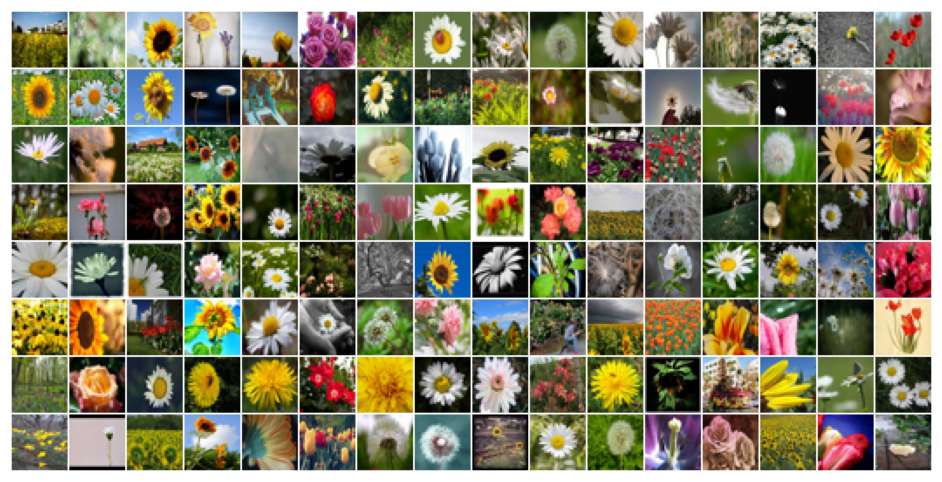

In [155]:
# make_grid(...)函数绘制图像的网格
plt.figure(figsize=(12, 6), facecolor='white')

for b_image, _ in loader:
    b_image = inverse_transform(b_image).cpu()
    grid_img = make_grid(b_image / 255.0, nrow=16, padding=True, pad_value=1, normalize=True)
    plt.imshow(grid_img.permute(1, 2, 0))
    plt.axis("off")
    break

# Diffusion Process

In [156]:
class SimpleDiffusion:
    """扩散类
    计算和管理在 DDPM 模型中用于扩散过程的一些关键参数和中间变量。
    这些参数和变量包括扩散的时间步数、图像的形状、模型运行的设备以及一些与时间步相关的调度参数（如 beta 和 alpha）等。
    """
    def __init__(
        self,
        num_diffusion_timesteps=1000,
        img_shape=(3, 64, 64),
        device="cpu",
    ):
        self.num_diffusion_timesteps = num_diffusion_timesteps
        self.img_shape = img_shape
        self.device = device

        self.initialize()

    def initialize(self):
        """计算并设置模型训练中需要使用的一些参数和中间变量,计算得到的变量用于控制和生成噪声，以及管理扩散过程的时间步长。"""
        # BETAs & ALPHAs required at different places in the Algorithm.
        self.beta  = self.get_betas()
        self.alpha = 1 - self.beta
        
        self_sqrt_beta                       = torch.sqrt(self.beta) # 计算 β 的平方根
        self.alpha_cumulative                = torch.cumprod(self.alpha, dim=0) # 计算 α 的累积乘积。这个值在扩散过程中用于生成噪声。
        self.sqrt_alpha_cumulative           = torch.sqrt(self.alpha_cumulative) # 计算 α 累积乘积的平方根。
        self.one_by_sqrt_alpha               = 1. / torch.sqrt(self.alpha) # 计算 1/α 的平方根的倒数。
        self.sqrt_one_minus_alpha_cumulative = torch.sqrt(1 - self.alpha_cumulative) # 计算 1 - α 的累积乘积的平方根。
         
    def get_betas(self):
        """linear schedule, proposed in original ddpm paper"""
        """定义 DDPM 中使用的线性方差调度程序的方法"""
        scale = 1000 / self.num_diffusion_timesteps
        beta_start = scale * 1e-4
        beta_end = scale * 0.02
        return torch.linspace(
            beta_start,
            beta_end,
            self.num_diffusion_timesteps,
            dtype=torch.float32,
            device=self.device,
        )

# 前向扩散过程
def forward_diffusion(sd: SimpleDiffusion, x0: torch.Tensor, timesteps: torch.Tensor):
    eps = torch.randn_like(x0)  # 噪声项,生成与输入 x0 形状相同的随机噪声 eps。
    mean    = get(sd.sqrt_alpha_cumulative, t=timesteps) * x0  # Image scaled 计算均值 mean，它是通过将输入 x0 乘以时间步长处的累积 α 的平方根得到的。扩散过程中图像的期望值。
    std_dev = get(sd.sqrt_one_minus_alpha_cumulative, t=timesteps) # Noise scaled 计算标准差 std_dev，它是通过取时间步长处 1 - α 的累积乘积的平方根得到的。这是扩散过程中噪声的标准差。
    sample  = mean + std_dev * eps # scaled inputs * scaled noise 将均值和噪声项相加，得到最终的扩散过程输出 sample。这一步表示图像的生成过程，其中噪声通过标准差进行缩放，并与均值相加。

    return sample, eps  # return ... , gt noise --> model predicts this) 返回生成的图像 sample 以及用于模型预测的噪声 eps。在训练过程中，模型的目标是学习如何逆向地将这个生成过程逆转，以还原原始图像。

## Sample Forward Diffusion Process
可视化样本图像上的前向扩散过程，以了解它们在通过马尔可夫链的T时间步长时如何被损坏的。

In [157]:
sd = SimpleDiffusion(num_diffusion_timesteps=TrainingConfig.TIMESTEPS, device="cpu")

loader = iter(  # converting dataloader into an iterator for now.
    get_dataloader(
        dataset_name=BaseConfig.DATASET,
        batch_size=6,
        device="cpu",
    )
)

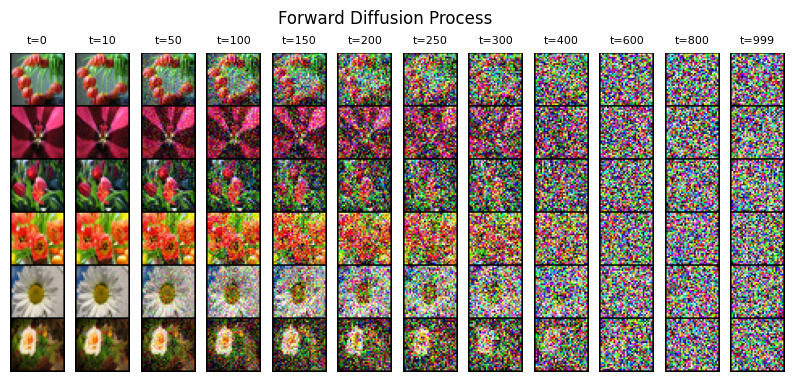

In [158]:
# 对某些特定时间步执行前向过程，并存储原始图像的噪声版本。
x0s, _ = next(loader)

noisy_images = []
specific_timesteps = [0, 10, 50, 100, 150, 200, 250, 300, 400, 600, 800, 999]

for timestep in specific_timesteps:
    timestep = torch.as_tensor(timestep, dtype=torch.long)

    xts, _ = forward_diffusion(sd, x0s, timestep)
    xts = inverse_transform(xts) / 255.0
    xts = make_grid(xts, nrow=1, padding=1)

    noisy_images.append(xts)

# 绘制不同时间步长的样本损坏情况。

_, ax = plt.subplots(1, len(noisy_images), figsize=(10, 5), facecolor="white")

for i, (timestep, noisy_sample) in enumerate(zip(specific_timesteps, noisy_images)):
    ax[i].imshow(noisy_sample.squeeze(0).permute(1, 2, 0))
    ax[i].set_title(f"t={timestep}", fontsize=8)
    ax[i].axis("off")
    ax[i].grid(False)

plt.suptitle("Forward Diffusion Process", y=0.9)
plt.axis("off")
plt.show()

# Training

去噪扩散概率模型中使用的训练和采样算法
![](./images/Algorithm.png)

In [159]:
# 定义所有与模型相关的超参数

@dataclass
class ModelConfig:
    BASE_CH = 64  # 64, 128, 256, 256
    BASE_CH_MULT = (1, 2, 4, 4) # 32, 16, 8, 8 
    APPLY_ATTENTION = (False, True, True, False)
    DROPOUT_RATE = 0.1
    TIME_EMB_MULT = 4 # 128

In [160]:
# 初始化UNet模型、  AdamW 优化器、MSE loss函数和其他必要的类

model = UNet(
    input_channels          = TrainingConfig.IMG_SHAPE[0],
    output_channels         = TrainingConfig.IMG_SHAPE[0],
    base_channels           = ModelConfig.BASE_CH,
    base_channels_multiples = ModelConfig.BASE_CH_MULT,
    apply_attention         = ModelConfig.APPLY_ATTENTION,
    dropout_rate            = ModelConfig.DROPOUT_RATE,
    time_multiple           = ModelConfig.TIME_EMB_MULT,
)
model.to(BaseConfig.DEVICE)

optimizer = torch.optim.AdamW(model.parameters(), lr=TrainingConfig.LR)

dataloader = get_dataloader(
    dataset_name  = BaseConfig.DATASET,
    batch_size    = TrainingConfig.BATCH_SIZE,
    device        = BaseConfig.DEVICE,
    pin_memory    = True,
    num_workers   = TrainingConfig.NUM_WORKERS,
)

loss_fn = nn.MSELoss()

sd = SimpleDiffusion(
    num_diffusion_timesteps = TrainingConfig.TIMESTEPS,
    img_shape               = TrainingConfig.IMG_SHAPE,
    device                  = BaseConfig.DEVICE,
)

scaler = amp.GradScaler()

In [161]:
# 初始化日志记录和检查点目录以保存中间采样结果和模型参数
total_epochs = TrainingConfig.NUM_EPOCHS + 1
log_dir, checkpoint_dir = setup_log_directory(config=BaseConfig())

generate_video = False
ext = ".mp4" if generate_video else ".png"

Logging at: Logs_Checkpoints\Inference\version_7
Model Checkpoint at: Logs_Checkpoints\checkpoints\version_7


In [162]:
# Algorithm 1: Training
"""执行一个训练周期"""

def train_one_epoch(model, sd, loader, optimizer, scaler, loss_fn, epoch=800, 
                   base_config=BaseConfig(), training_config=TrainingConfig()):
    
    # MeanMetric是一个记录均值的辅助类，用于记录损失值的均值
    loss_record = MeanMetric()
    model.train()

    # 使用tqdm创建一个进度条，显示训练进度
    with tqdm(total=len(loader), dynamic_ncols=True) as tq:
        # 设置进度条的描述信息，显示当前训练周期和总训练周期数
        tq.set_description(f"Train :: Epoch: {epoch}/{training_config.NUM_EPOCHS}")
        # 遍历数据加载器中的每个小批量数据 
        for x0s, _ in loader:
            # 更新进度条
            tq.update(1)
            # 为每个样本生成一个随机的时间步长
            ts = torch.randint(low=1, high=training_config.TIMESTEPS, size=(x0s.shape[0],), device=base_config.DEVICE)
            # 调用前向扩散函数，生成经过扩散过程的图像和真实噪声
            xts, gt_noise = forward_diffusion(sd, x0s, ts) # 

            # 使用PyTorch的自动混合精度训练,更快地训练模型并节省 GPU 内存。
            with amp.autocast():
                # 使用模型对扩散过程后的图像进行预测，得到模型生成的噪声
                pred_noise = model(xts, ts)
                # 计算损失，衡量模型生成的噪声与真实噪声之间的差异
                loss = loss_fn(gt_noise, pred_noise)

            # 清零梯度，准备进行反向传播
            optimizer.zero_grad(set_to_none=True)
            # 使用混合精度训练，对损失进行反向传播
            scaler.scale(loss).backward()

            # scaler.unscale_(optimizer)
            # torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)

            # 调整模型参数
            scaler.step(optimizer)
            # 更新缩放器
            scaler.update()

            # 获取损失值
            loss_value = loss.detach().item()
            # 更新损失值的均值记录
            loss_record.update(loss_value)

            # 在进度条上显示当前损失值
            tq.set_postfix_str(s=f"Loss: {loss_value:.4f}")
        
        # 计算并获取整个训练周期的平均损失值
        mean_loss = loss_record.compute().item()
        # 在进度条上显示整个训练周期的平均损失值
        tq.set_postfix_str(s=f"Epoch Loss: {mean_loss:.4f}")
    # 返回整个训练周期的平均损失值
    return mean_loss

In [163]:
# Algorithm 2: Sampling
"""采样算法，用于从模型中生成样本。
通过模型进行反向过程，根据预测的噪声和时间步相关的参数来逐步逆向生成样本，最终得到与原始数据流形结构相近的样本。
如果指定生成视频，则保存整个逆向过程的图像帧。
"""

# 装饰器，用于在采样期间关闭梯度追踪和自动微分。提高采样效率。
@torch.inference_mode()
def reverse_diffusion(model, sd, timesteps=1000, img_shape=(3, 64, 64), 
                      num_images=5, nrow=8, device="cpu", **kwargs):

    # 生成一个形状为 (num_images, *img_shape) 的随机张量 x，代表初始样本。
    x = torch.randn((num_images, *img_shape), device=device)
    model.eval()

    # 检查是否要生成视频，根据传入的参数判断是否执行生成视频的操作。
    if kwargs.get("generate_video", False):
        outs = []

    # 使用 tqdm 创建一个反向迭代的进度条，从 timesteps - 1 到 1，表示逆变换的时间步。
    for time_step in tqdm(iterable=reversed(range(1, timesteps)), 
                          total=timesteps-1, dynamic_ncols=False, 
                          desc="Sampling :: ", position=0):

        # 创建一个张量 ts，其值为当前时间步 time_step,用于模型的时间步输入。
        ts = torch.ones(num_images, dtype=torch.long, device=device) * time_step
        # 根据当前时间步生成噪声张量 z，如果是第一步（time_step > 1），则 z 是零张量。
        z = torch.randn_like(x) if time_step > 1 else torch.zeros_like(x)

        # 使用模型生成预测噪声
        predicted_noise = model(x, ts)

        # 从预先计算的 sd（schedule）中获取与当前时间步相关的参数。
        beta_t                            = get(sd.beta, ts)
        one_by_sqrt_alpha_t               = get(sd.one_by_sqrt_alpha, ts)
        sqrt_one_minus_alpha_cumulative_t = get(sd.sqrt_one_minus_alpha_cumulative, ts) 

        #  进行逆变换，根据获取的参数更新样本 x。
        x = (
            one_by_sqrt_alpha_t
            * (x - (beta_t / sqrt_one_minus_alpha_cumulative_t) * predicted_noise)
            + torch.sqrt(beta_t) * z
        )
        
        if kwargs.get("generate_video", False):
            x_inv = inverse_transform(x).type(torch.uint8)
            grid = make_grid(x_inv, nrow=nrow, pad_value=255.0).to("cpu")
            ndarr = torch.permute(grid, (1, 2, 0)).numpy()[:, :, ::-1]
            outs.append(ndarr)

    if kwargs.get("generate_video", False): # Generate and save video of the entire reverse process. 
        frames2vid(outs, kwargs['save_path'])
        display(Image.fromarray(outs[-1][:, :, ::-1])) # Display the image at the final timestep of the reverse process.
        return None

    # 如果不生成视频，将逆变换后的样本转换为图像，然后保存或显示图像。
    else: # Display and save the image at the final timestep of the reverse process. 
        x = inverse_transform(x).type(torch.uint8)
        grid = make_grid(x, nrow=nrow, pad_value=255.0).to("cpu")
        pil_image = TF.functional.to_pil_image(grid)
        pil_image.save(kwargs['save_path'], format=save_path[-3:].upper())
        display(pil_image)
        return None

Sampling :: 100%|████████████████████████████████████████████████████████████████████| 999/999 [00:14<00:00, 68.12it/s]


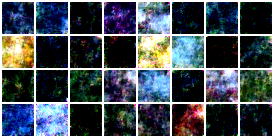

Sampling :: 100%|████████████████████████████████████████████████████████████████████| 999/999 [00:14<00:00, 67.98it/s]


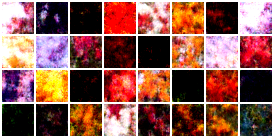

Sampling :: 100%|████████████████████████████████████████████████████████████████████| 999/999 [00:15<00:00, 63.08it/s]


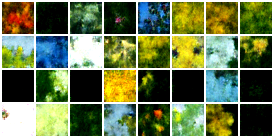

Sampling :: 100%|████████████████████████████████████████████████████████████████████| 999/999 [00:15<00:00, 63.26it/s]


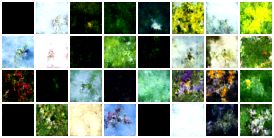

Sampling :: 100%|████████████████████████████████████████████████████████████████████| 999/999 [00:15<00:00, 63.19it/s]


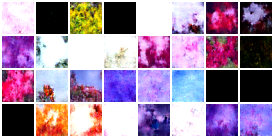

Sampling :: 100%|████████████████████████████████████████████████████████████████████| 999/999 [00:15<00:00, 63.24it/s]


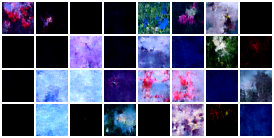

Sampling :: 100%|████████████████████████████████████████████████████████████████████| 999/999 [00:15<00:00, 63.25it/s]


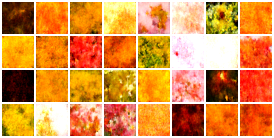

Sampling :: 100%|████████████████████████████████████████████████████████████████████| 999/999 [00:15<00:00, 63.34it/s]


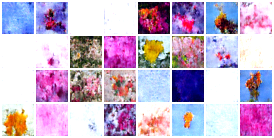

Sampling :: 100%|████████████████████████████████████████████████████████████████████| 999/999 [00:15<00:00, 63.33it/s]


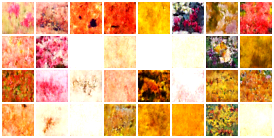

Sampling :: 100%|████████████████████████████████████████████████████████████████████| 999/999 [00:15<00:00, 63.23it/s]


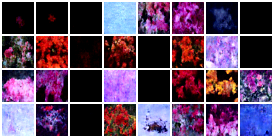

Sampling :: 100%|████████████████████████████████████████████████████████████████████| 999/999 [00:15<00:00, 63.26it/s]


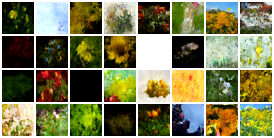

Sampling :: 100%|████████████████████████████████████████████████████████████████████| 999/999 [00:14<00:00, 67.05it/s]


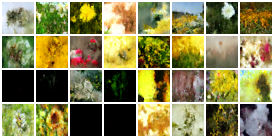

Sampling :: 100%|████████████████████████████████████████████████████████████████████| 999/999 [00:14<00:00, 68.12it/s]


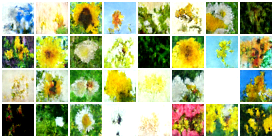

Sampling :: 100%|████████████████████████████████████████████████████████████████████| 999/999 [00:14<00:00, 67.98it/s]


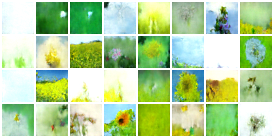

Sampling :: 100%|████████████████████████████████████████████████████████████████████| 999/999 [00:15<00:00, 66.59it/s]


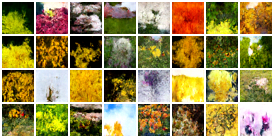

Sampling :: 100%|████████████████████████████████████████████████████████████████████| 999/999 [00:14<00:00, 68.13it/s]


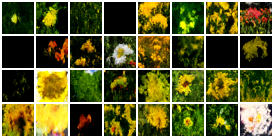

Sampling :: 100%|████████████████████████████████████████████████████████████████████| 999/999 [00:14<00:00, 67.90it/s]


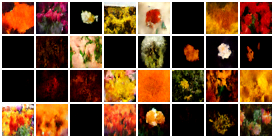

Sampling :: 100%|████████████████████████████████████████████████████████████████████| 999/999 [00:14<00:00, 68.10it/s]


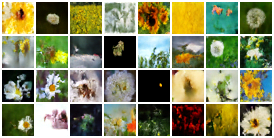

Sampling :: 100%|████████████████████████████████████████████████████████████████████| 999/999 [00:14<00:00, 68.07it/s]


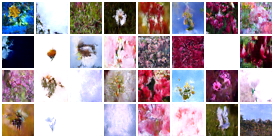

Sampling :: 100%|████████████████████████████████████████████████████████████████████| 999/999 [00:14<00:00, 68.07it/s]


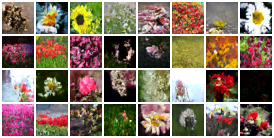

Sampling :: 100%|████████████████████████████████████████████████████████████████████| 999/999 [00:14<00:00, 67.53it/s]


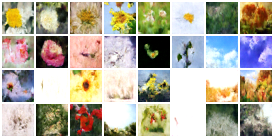

Sampling :: 100%|████████████████████████████████████████████████████████████████████| 999/999 [00:14<00:00, 68.07it/s]


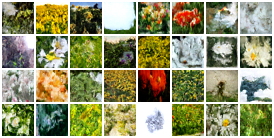

Sampling :: 100%|████████████████████████████████████████████████████████████████████| 999/999 [00:14<00:00, 68.00it/s]


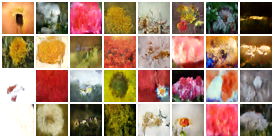

Sampling :: 100%|████████████████████████████████████████████████████████████████████| 999/999 [00:14<00:00, 68.06it/s]


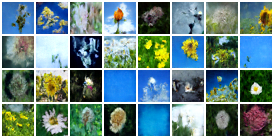

Sampling :: 100%|████████████████████████████████████████████████████████████████████| 999/999 [00:14<00:00, 68.01it/s]


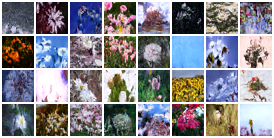

Sampling :: 100%|████████████████████████████████████████████████████████████████████| 999/999 [00:14<00:00, 67.81it/s]


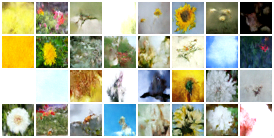

Sampling :: 100%|████████████████████████████████████████████████████████████████████| 999/999 [00:14<00:00, 67.97it/s]


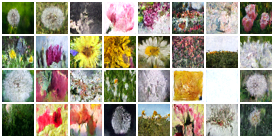

Sampling :: 100%|████████████████████████████████████████████████████████████████████| 999/999 [00:14<00:00, 67.93it/s]


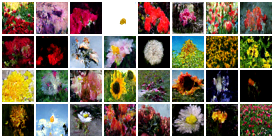

Sampling :: 100%|████████████████████████████████████████████████████████████████████| 999/999 [00:14<00:00, 68.06it/s]


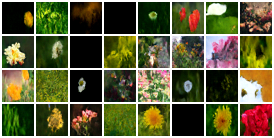

Sampling :: 100%|████████████████████████████████████████████████████████████████████| 999/999 [00:14<00:00, 68.13it/s]


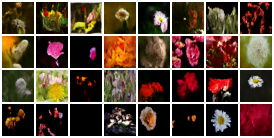

Sampling :: 100%|████████████████████████████████████████████████████████████████████| 999/999 [00:14<00:00, 67.39it/s]


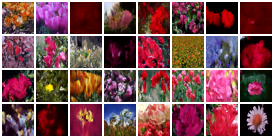

Sampling :: 100%|████████████████████████████████████████████████████████████████████| 999/999 [00:14<00:00, 67.97it/s]


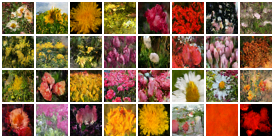

Sampling :: 100%|████████████████████████████████████████████████████████████████████| 999/999 [00:14<00:00, 67.96it/s]


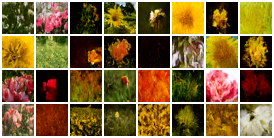

Sampling :: 100%|████████████████████████████████████████████████████████████████████| 999/999 [00:14<00:00, 68.00it/s]


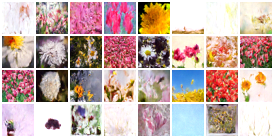

Sampling :: 100%|████████████████████████████████████████████████████████████████████| 999/999 [00:14<00:00, 68.04it/s]


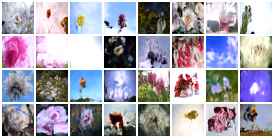

Sampling :: 100%|████████████████████████████████████████████████████████████████████| 999/999 [00:14<00:00, 68.02it/s]


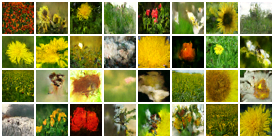

Sampling :: 100%|████████████████████████████████████████████████████████████████████| 999/999 [00:14<00:00, 68.10it/s]


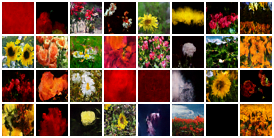

Sampling :: 100%|████████████████████████████████████████████████████████████████████| 999/999 [00:14<00:00, 68.01it/s]


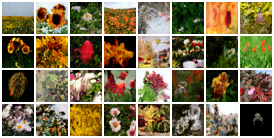

Sampling :: 100%|████████████████████████████████████████████████████████████████████| 999/999 [00:14<00:00, 67.64it/s]


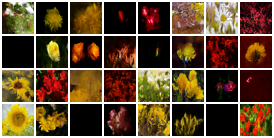

Sampling :: 100%|████████████████████████████████████████████████████████████████████| 999/999 [00:14<00:00, 67.88it/s]


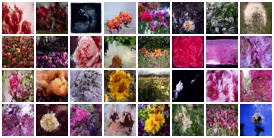

In [166]:
# 训练循环
for epoch in range(1, total_epochs):
    torch.cuda.empty_cache()
    gc.collect()
    
    # Algorithm 1: Training
    train_one_epoch(model, sd, dataloader, optimizer, scaler, loss_fn, epoch=epoch)

    if epoch % 20 == 0:
        save_path = os.path.join(log_dir, f"{epoch}{ext}")
        
        # Algorithm 2: Sampling
        reverse_diffusion(model, sd, timesteps=TrainingConfig.TIMESTEPS, num_images=32, generate_video=generate_video,
            save_path=save_path, img_shape=TrainingConfig.IMG_SHAPE, device=BaseConfig.DEVICE,
        )

        # clear_output()
        checkpoint_dict = {
            "opt": optimizer.state_dict(),
            "scaler": scaler.state_dict(),
            "model": model.state_dict()
        }
        torch.save(checkpoint_dict, os.path.join(checkpoint_dir, "ckpt.tar"))
        del checkpoint_dict

# Inference
使用 DDPM 生成图像

In [168]:
# 重新加载保存的模型
model = UNet(
    input_channels          = TrainingConfig.IMG_SHAPE[0],
    output_channels         = TrainingConfig.IMG_SHAPE[0],
    base_channels           = ModelConfig.BASE_CH,
    base_channels_multiples = ModelConfig.BASE_CH_MULT,
    apply_attention         = ModelConfig.APPLY_ATTENTION,
    dropout_rate            = ModelConfig.DROPOUT_RATE,
    time_multiple           = ModelConfig.TIME_EMB_MULT,
)
model.load_state_dict(torch.load(os.path.join(checkpoint_dir, "ckpt.tar"), map_location='cpu')['model'])

model.to(BaseConfig.DEVICE)

sd = SimpleDiffusion(
    num_diffusion_timesteps = TrainingConfig.TIMESTEPS,
    img_shape               = TrainingConfig.IMG_SHAPE,
    device                  = BaseConfig.DEVICE,
)

log_dir = "inference_results"
os.makedirs(log_dir, exist_ok=True)

Sampling :: 100%|████████████████████████████████████████████████████████████████████| 999/999 [01:33<00:00, 10.68it/s]


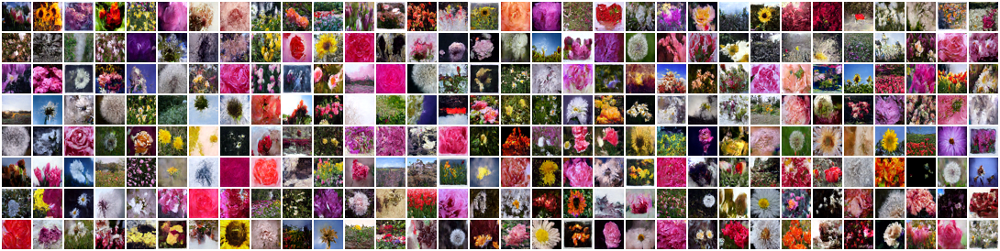

inference_results\20240103-203252.mp4


In [169]:
generate_video = True

ext = ".mp4" if generate_video else ".png"
filename = f"{datetime.now().strftime('%Y%m%d-%H%M%S')}{ext}"

save_path = os.path.join(log_dir, filename)

# 使用训练后的模型调用推理函数
reverse_diffusion(
    model,
    sd,
    num_images=256,
    generate_video=generate_video,
    save_path=save_path,
    timesteps=1000,
    img_shape=TrainingConfig.IMG_SHAPE,
    device=BaseConfig.DEVICE,
    nrow=32,
)
print(save_path)

Sampling :: 100%|████████████████████████████████████████████████████████████████████| 999/999 [00:48<00:00, 20.50it/s]


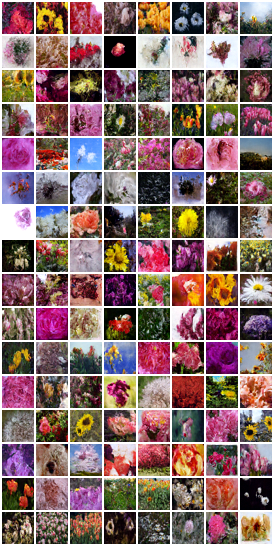

inference_results\20240103-203429.png


In [170]:
generate_video = False

ext = ".mp4" if generate_video else ".png"
filename = f"{datetime.now().strftime('%Y%m%d-%H%M%S')}{ext}"

save_path = os.path.join(log_dir, filename)


reverse_diffusion(
    model,
    sd,
    num_images=128,
    generate_video=generate_video,
    save_path=save_path,
    timesteps=1000,
    img_shape=TrainingConfig.IMG_SHAPE,
    device=BaseConfig.DEVICE,
    nrow=8,
)

print(save_path)

Sampling :: 100%|████████████████████████████████████████████████████████████████████| 999/999 [00:48<00:00, 20.58it/s]


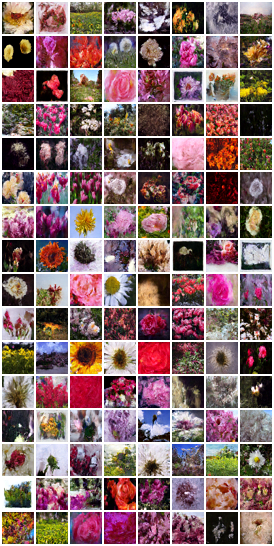

inference_results\20240103-203518.png


In [171]:
generate_video = False

ext = ".mp4" if generate_video else ".png"
filename = f"{datetime.now().strftime('%Y%m%d-%H%M%S')}{ext}"

save_path = os.path.join(log_dir, filename)


reverse_diffusion(
    model,
    sd,
    num_images=128,
    generate_video=generate_video,
    save_path=save_path,
    timesteps=1000,
    img_shape=TrainingConfig.IMG_SHAPE,
    device=BaseConfig.DEVICE,
    nrow=8,
)
print(save_path)

Sampling :: 100%|████████████████████████████████████████████████████████████████████| 999/999 [00:48<00:00, 20.62it/s]


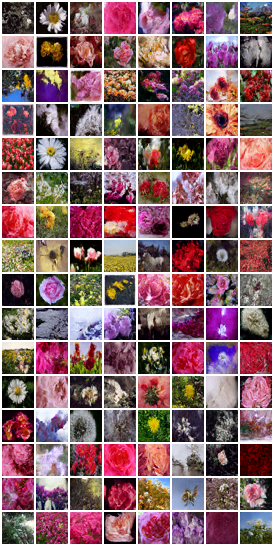

inference_results\20240103-203607.png


In [172]:
generate_video = False

ext = ".mp4" if generate_video else ".png"
filename = f"{datetime.now().strftime('%Y%m%d-%H%M%S')}{ext}"

save_path = os.path.join(log_dir, filename)


reverse_diffusion(
    model,
    sd,
    num_images=128,
    generate_video=generate_video,
    save_path=save_path,
    timesteps=1000,
    img_shape=TrainingConfig.IMG_SHAPE,
    device=BaseConfig.DEVICE,
    nrow=8,
)
print(save_path)

Sampling :: 100%|████████████████████████████████████████████████████████████████████| 999/999 [00:48<00:00, 20.66it/s]


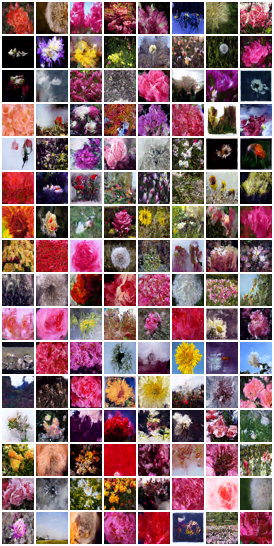

In [173]:
generate_video = False

ext = ".mp4" if generate_video else ".png"
filename = f"{datetime.now().strftime('%Y%m%d-%H%M%S')}{ext}"

save_path = os.path.join(log_dir, filename)


reverse_diffusion(
    model,
    sd,
    num_images=128,
    generate_video=generate_video,
    save_path=save_path,
    timesteps=1000,
    img_shape=TrainingConfig.IMG_SHAPE,
    device=BaseConfig.DEVICE,
    nrow=8,
)

Sampling :: 100%|████████████████████████████████████████████████████████████████████| 999/999 [00:48<00:00, 20.64it/s]


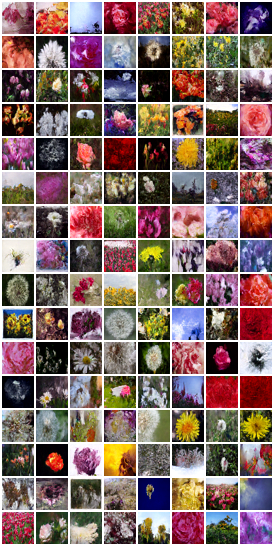

In [174]:
generate_video = False

ext = ".mp4" if generate_video else ".png"
filename = f"{datetime.now().strftime('%Y%m%d-%H%M%S')}{ext}"

save_path = os.path.join(log_dir, filename)

reverse_diffusion(
    model,
    sd,
    num_images=128,
    generate_video=generate_video,
    save_path=save_path,
    timesteps=1000,
    img_shape=TrainingConfig.IMG_SHAPE,
    device=BaseConfig.DEVICE,
    nrow=8,
)

Sampling :: 100%|████████████████████████████████████████████████████████████████████| 999/999 [00:14<00:00, 67.31it/s]


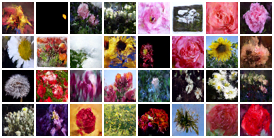

In [175]:
generate_gif = False

ext = ".gif" if generate_gif else ".png"
filename = f"{datetime.now().strftime('%Y%m%d-%H%M%S')}{ext}"

save_path = os.path.join(log_dir, filename)


reverse_diffusion(
    model,
    sd,
    num_images=32,
    generate_gif=generate_gif,
    save_path=save_path,
    timsteps=TrainingConfig.TIMESTEPS,
    img_shape=TrainingConfig.IMG_SHAPE,
    device=BaseConfig.DEVICE,
)

Sampling :: 100%|████████████████████████████████████████████████████████████████████| 999/999 [00:14<00:00, 67.31it/s]


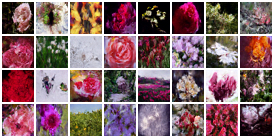

In [176]:
generate_gif = False

ext = ".gif" if generate_gif else ".png"
filename = f"{datetime.now().strftime('%Y%m%d-%H%M%S')}{ext}"

save_path = os.path.join(log_dir, filename)


reverse_diffusion(
    model,
    sd,
    num_images=32,
    generate_gif=generate_gif,
    save_path=save_path,
    timsteps=TrainingConfig.TIMESTEPS,
    img_shape=TrainingConfig.IMG_SHAPE,
    device=BaseConfig.DEVICE,
)